In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### Manual 2d convolution

In [2]:
def convolve2d(image, kernel):
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=float)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+kh, j:j+kw]
            output[i, j] = np.sum(region * kernel)
    return np.clip(output, 0, 255).astype(np.uint8)

# 1. Spatial Filtering

## a) Smoothing filters

### Mean/Average Filtering

#### Effect of Increasing Mean Filter Kernel Size

- **Noise reduction:**  
  Increasing the box (mean) filter kernel size reduces noise by averaging over more pixels.  

- **Blur effect:**  
  Larger kernels increase blur by smoothing **edges and fine details**.  

- **Quantitative analysis:**  
  For independent zero-mean noise with variance `σ²`, averaging over a `k × k` window reduces the noise variance to:  

  $$
  \sigma_{\text{out}}^{2} = \frac{\sigma^{2}}{k^{2}}
  $$

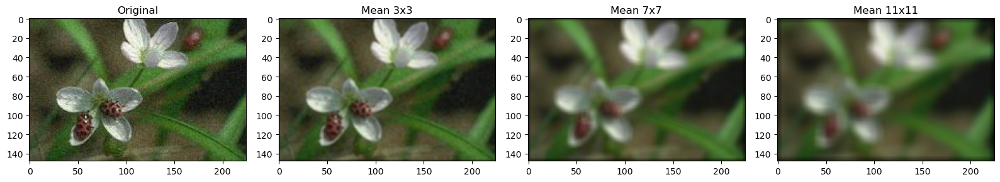

In [ ]:
def mean_filter(image, ksize):
    kernel = np.ones((ksize, ksize), dtype=float) / (ksize * ksize)
    if image.ndim == 3:
        filtered_channels = []
        for c in range(image.shape[2]):
            filtered_channels.append(convolve2d(image[..., c], kernel))
        return np.stack(filtered_channels, axis=2)
    else:
        return convolve2d(image, kernel)

image = cv2.imread("../images/q1/Image_1_noise.jpg")
image[:, :, [0, 2]] = image[:, :, [2, 0]]

mean3 = mean_filter(image, 3)
mean7 = mean_filter(image, 7)
mean11 = mean_filter(image, 11)

plt.figure(figsize=(16,12))
plt.subplot(1,4,1); plt.imshow(image); plt.title("Original"); 
plt.subplot(1,4,2); plt.imshow(mean3); plt.title("Mean 3x3"); 
plt.subplot(1,4,3); plt.imshow(mean7); plt.title("Mean 7x7"); 
plt.subplot(1,4,4); plt.imshow(mean11); plt.title("Mean 11x11"); 
plt.tight_layout()
plt.show()

#### Analysis:


### Gaussian Filtering

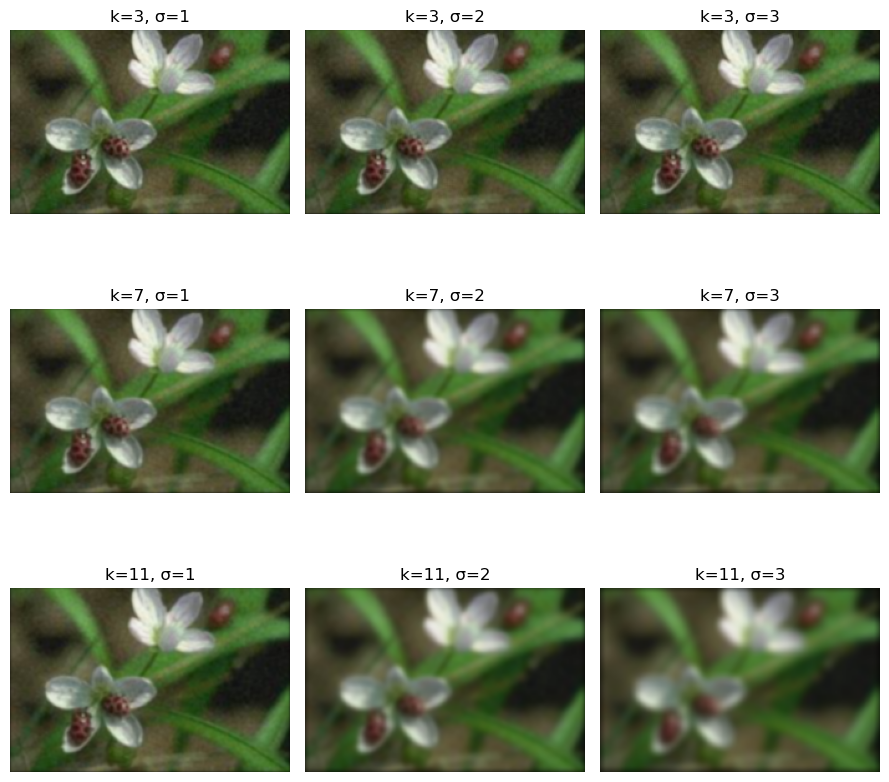

In [ ]:
def gaussian_kernel(ksize, sigma):
    ax = np.linspace(-(ksize // 2), ksize // 2, ksize)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)
    return kernel

def gaussian_filter(image, ksize, sigma):
    kernel = gaussian_kernel(ksize, sigma)
    if image.ndim == 3:
        filtered_channels = []
        for c in range(image.shape[2]):
            filtered_channels.append(convolve2d(image[..., c], kernel))
        return np.stack(filtered_channels, axis=2)
    else:
        return convolve2d(image, kernel)

kernels = [3, 7, 11]
sigmas = [1, 2, 3]

plt.figure(figsize=(9,9))
for i, k in enumerate(kernels):
    for j, s in enumerate(sigmas):
        filtered = gaussian_filter(image, k, s)
        plt.subplot(3,3, i*3 + j + 1)
        plt.imshow(filtered, cmap='gray')
        plt.title(f"k={k}, σ={s}")
        plt.axis("off")
plt.tight_layout()
plt.show()

### Comparision between both the filters

In [ ]:
img1 = cv2.imread("../images/q1/image1.jpeg")
img1[:, :, [0, 2]] = img1[:, :, [2, 0]]
img2 = cv2.imread("../images/q1/image2.jpeg")
img2[:, :, [0, 2]] = img2[:, :, [2, 0]]

noisy_sp = img1.copy()
coords = [np.random.randint(0, noisy_sp.shape[0], 500),
          np.random.randint(0, noisy_sp.shape[1], 500)]
noisy_sp[coords[0], coords[1]] = 255
coords = [np.random.randint(0, noisy_sp.shape[0], 500),
          np.random.randint(0, noisy_sp.shape[1], 500)]
noisy_sp[coords[0], coords[1]] = 0

mean_clean = mean_filter(noisy_sp, 5)
gauss_clean = gaussian_filter(noisy_sp, 5, 1)


noisy_gauss = img2.astype(np.int16) + np.random.normal(0, 25, img2.shape).astype(np.int16)
noisy_gauss = np.clip(noisy_gauss, 0, 255).astype(np.uint8)

mean_clean2 = mean_filter(noisy_gauss, 5)
gauss_clean2 = gaussian_filter(noisy_gauss, 5, 1)


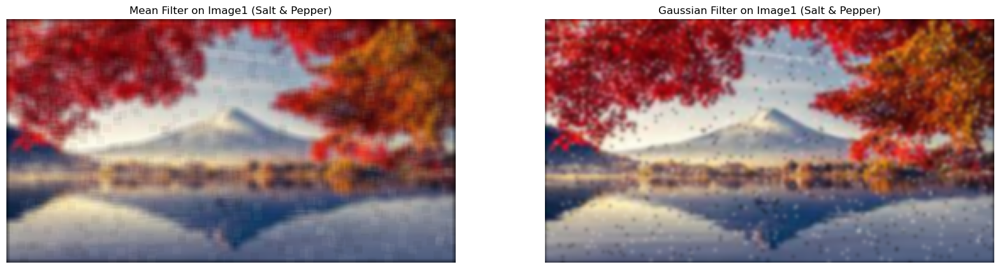

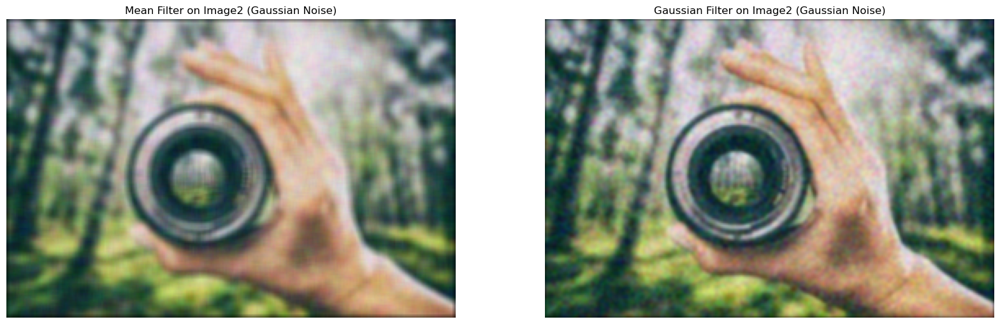

In [6]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1); plt.imshow(mean_clean); plt.title("Mean Filter on Image1 (Salt & Pepper)"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(gauss_clean); plt.title("Gaussian Filter on Image1 (Salt & Pepper)"); plt.axis("off")
plt.show()


plt.figure(figsize=(20,20))
plt.subplot(1,2,1); plt.imshow(mean_clean2); plt.title("Mean Filter on Image2 (Gaussian Noise)"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(gauss_clean2); plt.title("Gaussian Filter on Image2 (Gaussian Noise)"); plt.axis("off")
plt.show()

- Increasing kernel size in mean filter => stronger noise reduction but more blur, edges disappear.
- Gaussian filter: larger kernel + sigma => stronger smoothing, but preserves edges better than mean.
- For salt & pepper noise: mean filter removes isolated black/white pixels better.
- For Gaussian noise: Gaussian filter is superior since it matches the distribution of noise.

### b) Edge detection

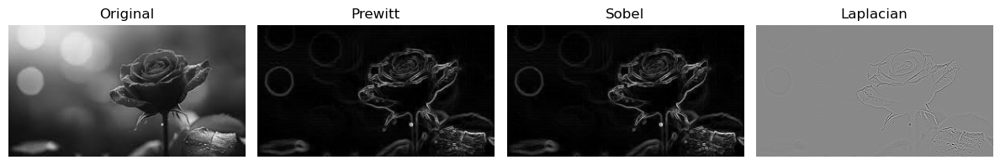

In [7]:
def apply_prewitt(gray_img):
    kernel_x = np.array([[-1, 0, 1],
                         [-1, 0, 1],
                         [-1, 0, 1]], np.float32)
    
    kernel_y = np.array([[1,  1,  1],
                         [0,  0,  0],
                         [-1, -1, -1]], np.float32)
    
    grad_x = cv2.filter2D(gray_img, cv2.CV_32F, kernel_x)
    grad_y = cv2.filter2D(gray_img, cv2.CV_32F, kernel_y)
    
    return cv2.magnitude(grad_x, grad_y)


def apply_sobel(gray_img):
    kernel_x = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]], np.float32)
    
    kernel_y = np.array([[1,  2,  1],
                         [0,  0,  0],
                         [-1, -2, -1]], np.float32)
    
    grad_x = cv2.filter2D(gray_img, cv2.CV_32F, kernel_x)
    grad_y = cv2.filter2D(gray_img, cv2.CV_32F, kernel_y)
    
    return cv2.magnitude(grad_x, grad_y)


def apply_laplacian(gray_img):
    kernel = np.array([[0,  1, 0],
                       [1, -4, 1],
                       [0,  1, 0]], np.float32)
    
    return cv2.filter2D(gray_img, cv2.CV_32F, kernel)

image = cv2.imread("../images/q1/image_edge.jpeg", cv2.IMREAD_GRAYSCALE)
prewitt_edges = apply_prewitt(image)
sobel_edges   = apply_sobel(image)
laplacian_edges = apply_laplacian(image)
plt.figure(figsize=(12, 6))

titles = ["Original", "Prewitt", "Sobel", "Laplacian"]
images = [image, prewitt_edges, sobel_edges, laplacian_edges]

for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

The Prewitt operator uses simple finite differences to estimate gradients, producing edge maps that capture basic directional changes but can be sensitive to noise. The Sobel operator improves on this by incorporating a weighted averaging that yields smoother, more continuous edges with better noise suppression. In contrast, the Laplacian detector, being a second derivative approach, highlights rapid intensity transitions and can produce sharper, but sometimes noisier and more fragmented, edges. Overall, while Prewitt and Sobel offer directional information, Sobel tends to generate more robust edges, whereas the Laplacian emphasizes fine details at the cost of increased sensitivity to noise.

### c) Image Sharpening

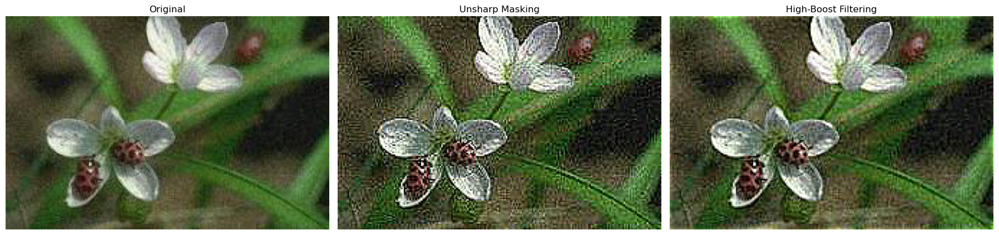

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def unsharp_mask(img):
    img = img.astype(np.float32)
    sharpened =  np.clip(img - apply_laplacian(img), 0, 255)
    return sharpened.astype(np.uint8)


def high_boost(img, alpha=1.5):
    img = img.astype(np.float32)
    boosted = np.clip(img + alpha * (img - gaussian_filter(img, ksize=7, sigma=1.5)), 0, 255)
    return boosted.astype(np.uint8)

src = cv2.imread("../images/q1/image_1_noise.jpg")
src[:, :, [0,2]] = src[:, :, [2,0]]

img_unsharp = unsharp_mask(src)
img_highboost = high_boost(src, alpha=1.5)

plt.figure(figsize=(18, 6))

images = {
    "Original": src,
    "Unsharp Masking": img_unsharp,
    "High-Boost Filtering": img_highboost
}

for i, (title, img) in enumerate(images.items(), 1):
    plt.subplot(1, 3, i)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

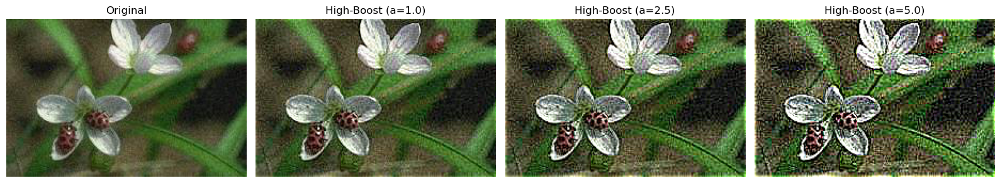

In [9]:
boost_factors = [1.0, 2.5, 5.0]
results = {a: high_boost(src, a) for a in boost_factors}

plt.figure(figsize=(16, 8))

plt.subplot(1, len(boost_factors) + 1, 1)
plt.imshow(src)
plt.title("Original")
plt.axis("off")

for idx, (a, img_boost) in enumerate(results.items(), start=2):
    plt.subplot(1, len(boost_factors) + 1, idx)
    plt.imshow(img_boost)
    plt.title(f"High-Boost (a={a})")
    plt.axis("off")

plt.tight_layout()
plt.show()

In high-boost filtering, the boost factor 'a' directly controls the intensity of the sharpening. It works by scaling the image's high-frequency details, the "detail map" obtained from `(Original - Blurred)`, before adding them back to the original image.

Increasing the value of **'a'** results in a more aggressive sharpening effect, making edges and textures appear crisper. However, this amplification is indiscriminate and can introduce significant visual artifacts if the value is too high. The two main consequences are **Noise Amplification** and **Halo Artifacts**

Therefore, the choice of 'a' is a trade-off between desired sharpness and image integrity. As demonstrated in the plots, a low value like `a=1.0` provides moderate enhancement, while a high value like `a=5.0` creates a much sharper but potentially noisy and artifact-ridden result. The optimal value depends on the specific image and the desired outcome.

## Histogram matching

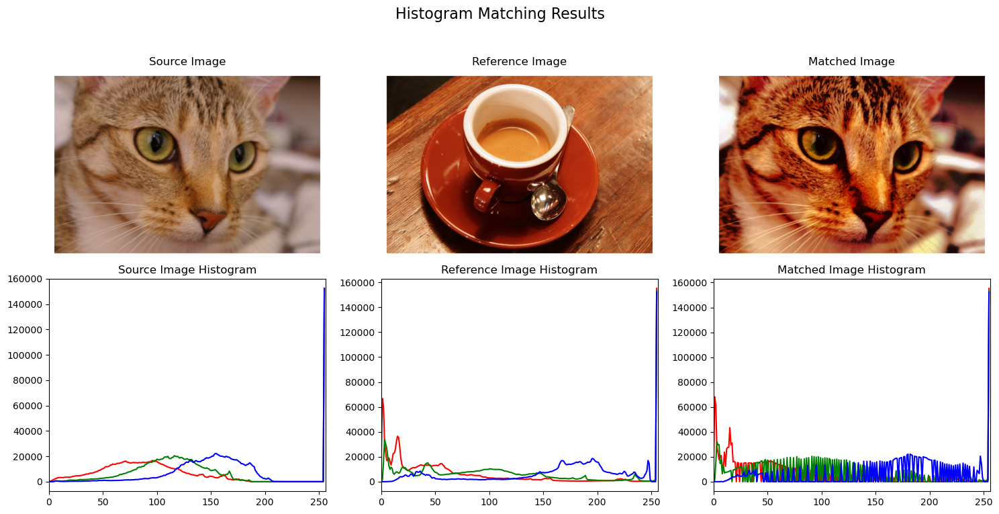

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compute_histogram_2d(image_channel):
    hist, _ = np.histogram(image_channel.ravel(), bins=256, range=(0, 256))
    return hist


def compute_cdf(histogram):
    cdf = histogram.cumsum()
    return cdf / cdf[-1]


def match_histograms_2d(source_channel, target_channel):
    src_hist = compute_histogram_2d(source_channel)
    ref_hist = compute_histogram_2d(target_channel)
    
    src_cdf = compute_cdf(src_hist)
    ref_cdf = compute_cdf(ref_hist)

    lut = np.zeros(256, dtype=np.uint8)
    j = 0
    for i in range(256):
        while j < 255 and ref_cdf[j] < src_cdf[i]:
            j += 1
        lut[i] = j

    return lut[source_channel]


src_img = cv2.imread('../images/q2/source_image.png')
ref_img = cv2.imread('../images/q2/target_image.png')
src_b, src_g, src_r = cv2.split(src_img)
ref_b, ref_g, ref_r = cv2.split(ref_img)
matched_b = match_histograms_2d(src_b, ref_b)
matched_g = match_histograms_2d(src_g, ref_g)
matched_r = match_histograms_2d(src_r, ref_r)
matched_img = cv2.merge([matched_b, matched_g, matched_r])


fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Histogram Matching Results', fontsize=16)
src_rgb = src_img[:, :, [2, 1, 0]]
ref_rgb = ref_img[:, :, [2, 1, 0]]
matched_rgb = matched_img[:, :, [2, 1, 0]]
images = [src_rgb, ref_rgb, matched_rgb]
titles = ['Source Image', 'Reference Image', 'Matched Image']
for ax, img, title in zip(axes[0], images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')
colors = ('r', 'g', 'b')
for ax, img, title in zip(axes[1], [src_img, ref_img, matched_img], titles):
    for ch, c in enumerate(colors):
        hist = compute_histogram_2d(img[:, :, ch])
        ax.plot(hist, color=c)
    ax.set_title(title + ' Histogram')
    ax.set_xlim([0, 256])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Q1: What happens when you match an image to its own histogram (self-matching)? Verify with a plot.
When the source and reference are the same, the mapping does nothing — the image remains unchanged.
This happens because both CDFs are identical, and the lookup table becomes the identity (LUT[i] = i).
So, self-matching is effectively a no-op.

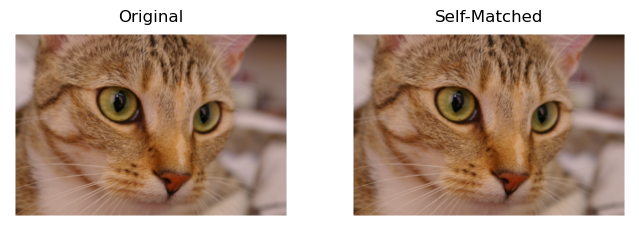

In [ ]:
self_b = match_histograms_2d(src_b, src_b)
self_g = match_histograms_2d(src_g, src_g)
self_r = match_histograms_2d(src_r, src_r)
self_matched_img = cv2.merge([self_b, self_g, self_r])

fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(src_img[:, :, [2, 1, 0]])
ax[0].set_title('Original')
ax[0].axis('off')
ax[1].imshow(self_matched_img[:, :, [2, 1, 0]])
ax[1].set_title('Self-Matched')
ax[1].axis('off')
plt.show()

#### Q2: When matching a bright image to a dark image, what happens to the noise visibility in the darker regions and why? Verify with a plot. You may choose any one bright image and one dark image and match them.

If a bright image is matched to a dark reference, small fluctuations (noise) in the bright source become much more visible.
That’s because the histogram mapping compresses the wide bright range into a narrow dark range.
This compression exaggerates differences between neighboring pixel values, making previously hidden noise obvious in the darkened result.

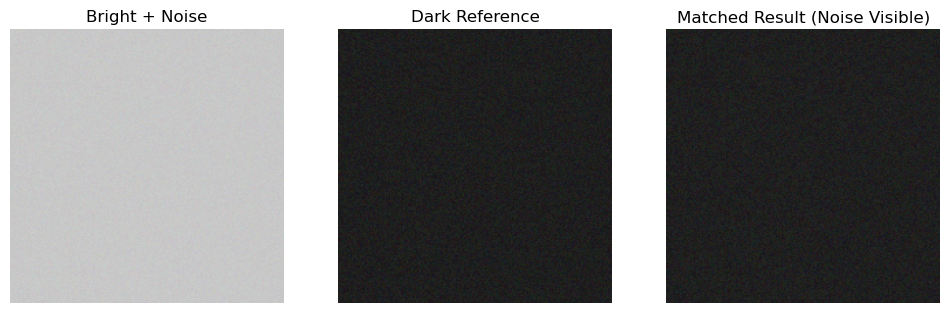

In [ ]:
bright_img = np.ones((200, 200, 3), dtype=np.uint8) * 200
noise = np.random.randint(-5, 6, bright_img.shape, dtype=np.int16)
bright_noisy = np.clip(bright_img.astype(np.int16) + noise, 0, 255).astype(np.uint8)

dark_img = np.random.randint(20, 41, (200, 200, 3), dtype=np.uint8)

mb = match_histograms_2d(bright_noisy[:, :, 0], dark_img[:, :, 0])
mg = match_histograms_2d(bright_noisy[:, :, 1], dark_img[:, :, 1])
mr = match_histograms_2d(bright_noisy[:, :, 2], dark_img[:, :, 2])
matched_dark = cv2.merge([mb, mg, mr])

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(bright_noisy[:, :, [2, 1, 0]])
ax[0].set_title('Bright + Noise')
ax[0].axis('off')
ax[1].imshow(dark_img[:, :, [2, 1, 0]])
ax[1].set_title('Dark Reference')
ax[1].axis('off')
ax[2].imshow(matched_dark[:, :, [2, 1, 0]])
ax[2].set_title('Matched Result (Noise Visible)')
ax[2].axis('off')
plt.show()

#### Q3: If the target histogram is uniform, how does the result differ from standard histogram equalization?

If the reference histogram is uniform, the result is exactly the same as standard histogram equalization.
Both approaches redistribute intensities so that they span the full range evenly, enhancing global contrast.
So, histogram matching with a uniform target is simply another way of implementing equalization.

## 3. Steganography With Bit-plane Slicing

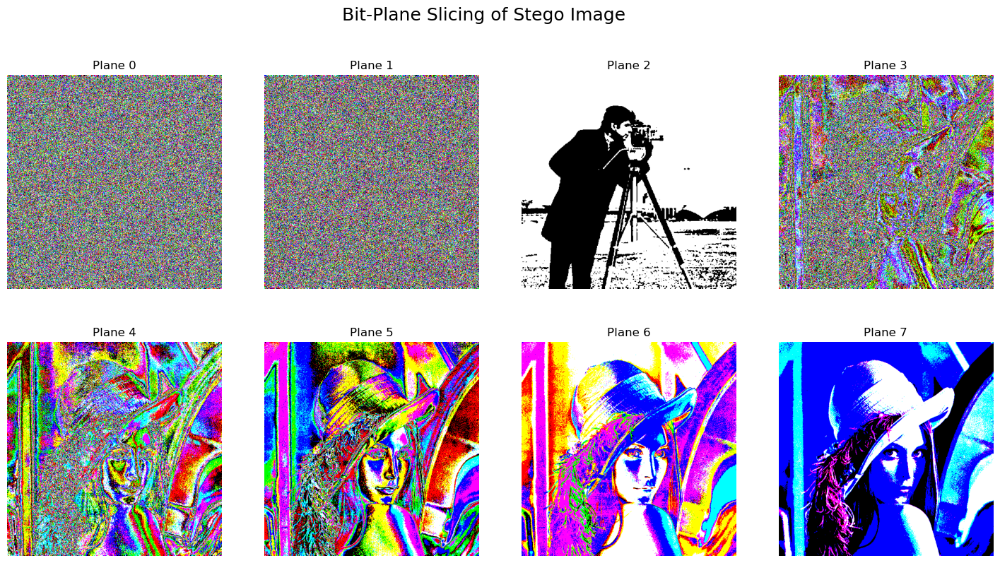

In [13]:
img = cv2.imread("../images/q3/encrypted_image.png")

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle("Bit-Plane Slicing of Stego Image", fontsize=18)

for bit_index in range(8):
    binary_mask = np.left_shift(1, bit_index)
    plane = img & binary_mask
    display_plane = np.where(plane != 0, 255, 0).astype(np.uint8)

    ax = axes[bit_index // 4, bit_index % 4]
    ax.imshow(display_plane, cmap="gray")
    ax.axis("off")
    lbl = f"Plane {bit_index}"
    ax.set_title(lbl)

plt.show()


Clearly from the plot above, `Plane 2` (where `0->LSB` and `7->MSB`) contains the embedded secret.

### b) Embedding in MSB vs. LSB

When a secret image is embedded in the Least Significant Bit (LSB) of a cover image, the changes introduced are very subtle. The LSB contributes the least to the overall pixel intensity, so modifying it does not noticeably affect the visual quality of the cover image. As a result, LSB embedding produces a stego image that is almost indistinguishable from the original to the human eye. However, the drawback is that LSB embedding is not very robust — even simple operations like image compression, filtering, or noise addition can easily destroy or alter the hidden information.

On the other hand, embedding in the Most Significant Bit (MSB) directly alters the dominant pixel values that define the overall structure and brightness of the image. This makes the presence of the secret much more visible, as significant distortions appear in the stego image. The advantage of MSB embedding is that the hidden data is relatively more robust to image processing operations, since it is encoded in the strongest bits of the pixel representation. However, this comes at the cost of high perceptual distortion, which makes MSB embedding unsuitable in scenarios where imperceptibility is critical.

Therefore, LSB embedding ensures imperceptibility but low robustness, while MSB embedding offers high robustness but poor imperceptibility. The choice between the two depends on whether the primary goal is to hide information invisibly or to ensure the information survives common image manipulations.

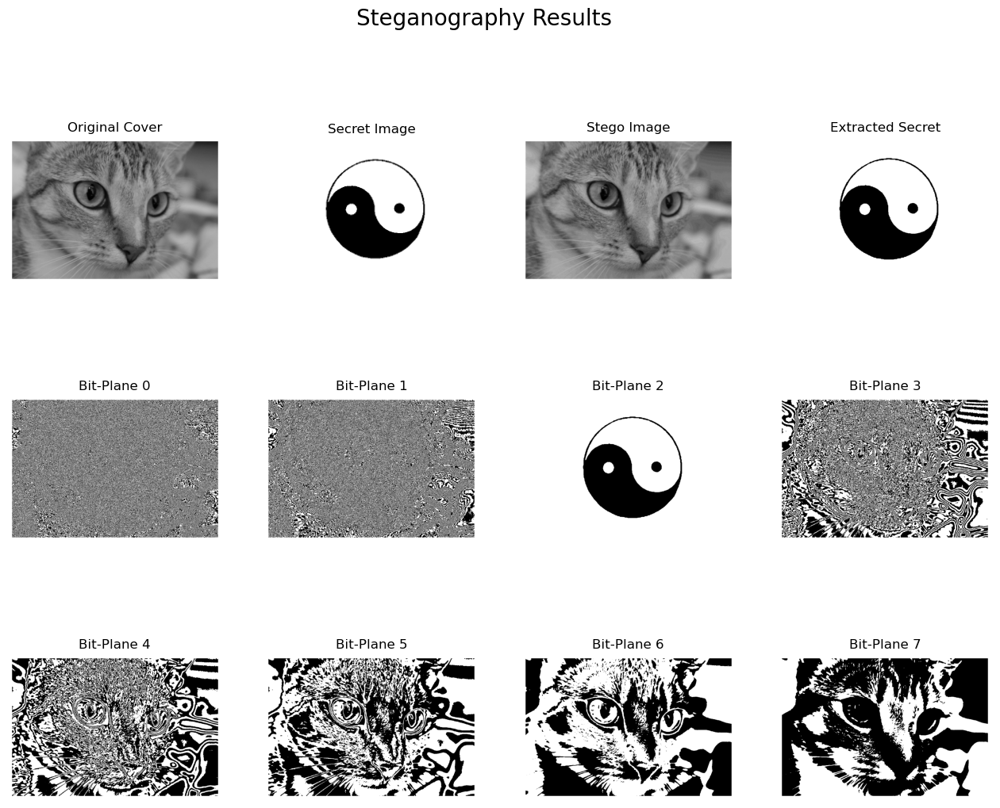

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def encrypt(cover_img, secret_img, bit_plane=0):
    resized_secret = cv2.resize(secret_img, (cover_img.shape[1], cover_img.shape[0]))
    _, binary_secret = cv2.threshold(resized_secret, 127, 1, cv2.THRESH_BINARY)
    cleared_cover = np.bitwise_and(cover_img,~(1 << bit_plane))
    shifted_secret = np.left_shift(binary_secret, bit_plane)
    stego_out = np.bitwise_or(cleared_cover, shifted_secret)
    return stego_out


def decrypt(stego_img, bit_plane=0):
    hidden_bits = np.bitwise_and(stego_img, np.uint8(1 << bit_plane))
    secret_out = np.where(hidden_bits > 0, 255, 0).astype(np.uint8)
    return secret_out

cover = cv2.imread('../images/q2/source_image.png', cv2.IMREAD_GRAYSCALE)
secret = cv2.imread('../images/q3/secret_image.png', cv2.IMREAD_GRAYSCALE)
stego = encrypt(cover, secret, bit_plane=2)
decrypted_secret = decrypt(stego, bit_plane=2)
plt.figure(figsize=(16, 12))
plt.suptitle('Steganography Results', fontsize=20)

plt.subplot(3, 4, 1); plt.imshow(cover, cmap='gray'); plt.title('Original Cover'); plt.axis('off')
plt.subplot(3, 4, 2); plt.imshow(secret, cmap='gray'); plt.title('Secret Image'); plt.axis('off')
plt.subplot(3, 4, 3); plt.imshow(stego, cmap='gray'); plt.title('Stego Image'); plt.axis('off')
plt.subplot(3, 4, 4); plt.imshow(decrypted_secret, cmap='gray'); plt.title('Extracted Secret'); plt.axis('off')
for i in range(8):
    plane = np.where((stego & (1 << i)) > 0, 255, 0).astype(np.uint8)
    plt.subplot(3, 4, i + 5)
    title = f'Bit-Plane {i}'
    plt.imshow(plane, cmap='gray'); plt.title(title); plt.axis('off')

plt.show()



### d) Encrypting a Grayscale Secret Image

So far, we have assumed that the secret image is binary, meaning it only requires a single bit to represent each pixel (0 or 1). In that case, it can be directly embedded in one bit-plane of the cover image. However, when the secret image is **grayscale**, each pixel typically has 8 bits (values from 0 to 255). This requires more sophisticated strategies for embedding. Some possible approaches include:

1. **Bit-Plane Splitting of the Secret Image**
   The grayscale secret can be decomposed into its 8 binary bit-planes (from MSB to LSB). Each bit-plane can then be embedded into one or more bit-planes of the cover image. For example, the secret’s lower bit-planes could be embedded into the LSBs of the cover image to maintain invisibility.

2. **Multiple LSB Embedding**
   Instead of embedding only a single bit per cover pixel, we can use multiple least significant bits of each cover pixel to store multiple bits of the grayscale secret. For instance, using the 2 least significant bits of each cover pixel doubles the capacity, allowing grayscale secret embedding while still maintaining reasonable imperceptibility.

3. **Error Diffusion or Approximation**
   If the full precision of the secret image is not required, we can approximate the grayscale secret by reducing its bit-depth (e.g., compressing it to 2–3 bits per pixel). This reduces the payload size, making it easier to embed invisibly in fewer bit-planes.

4. **Channel Splitting in Color Images**
   If the cover is a color image, the secret grayscale image can be distributed across the three channels (R, G, B). For example, one channel can store higher-order secret bits while others carry the lower-order bits, balancing robustness and invisibility.


## 4. HDR Images

**Why HDR Imaging is Required**

Traditional cameras and display devices have a limited **dynamic range**, meaning they cannot capture or represent the full spectrum of brightness levels that exist in real-world scenes. For example, in a scene containing both very bright regions (like the sky or sunlight) and very dark regions (like shadows), a single exposure image either loses detail in the bright areas (overexposure) or in the dark areas (underexposure).

**High Dynamic Range (HDR) imaging** overcomes this limitation by combining multiple images of the same scene taken at different exposure levels. This process preserves details in both highlights and shadows, producing an image that is much closer to what the human eye perceives.

HDR is therefore required because it:

1. **Captures a wider brightness range** – details are retained in both dark and bright areas.
2. **Improves realism** – resulting images are more faithful to human visual perception.
3. **Enables better post-processing** – photographers and imaging systems can adjust exposure, contrast, and tone mapping without losing information.

### a) HDR Merge function

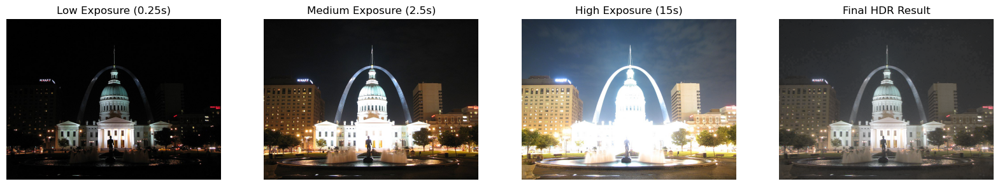

In [15]:
def hdr_merge(images, exposures):
    numerator = np.zeros_like(images[0], dtype=np.float32)
    denominator = np.zeros_like(images[0], dtype=np.float32)

    for img, t in zip(images, exposures):
        img_float = img.astype(np.float32) / 255.0
        numerator += img_float / t
        denominator += 1 / t
        
    hdr_image = numerator / (denominator + 1e-8)
    return hdr_image

def tone_map(hdr_merged_img):
    log_compressed = np.log1p(hdr_merged_img)
    normalized = log_compressed / np.max(log_compressed)
    gamma = 2.2
    gamma_corrected = np.power(normalized, 1.0 / gamma)
    final_image = (gamma_corrected * 255).astype(np.uint8)
    return final_image

img_low = cv2.imread('../images/q4/low_exp.png')
img_med = cv2.imread('../images/q4/med_exp.png')
img_high = cv2.imread('../images/q4/high_exp.png')

img_low = img_low[:, :, [2, 1, 0]]
img_med = img_med[:, :, [2, 1, 0]]
img_high = img_high[:, :, [2, 1, 0]]

images = [img_low, img_med, img_high]
exposures = [0.25, 2.5, 15.0]

hdr_result = hdr_merge(images, exposures)
tonemapped_result = tone_map(hdr_result)

plt.figure(figsize=(20, 5))
titles = ['Low Exposure (0.25s)', 'Medium Exposure (2.5s)', 'High Exposure (15s)']
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(1, 4, i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.subplot(1, 4, 4)
plt.imshow(tonemapped_result)
plt.title('Final HDR Result')
plt.axis('off')
plt.show()

### d) Observations

  * **Shadows**: The **High Exposure** image shows clear details in the darkest parts of the scene, but the bright areas are completely white and washed out. The final **HDR Result** successfully **preserves the rich shadow detail** from the high exposure shot without suffering from its blown-out highlights. You can see textures and objects in the shadows that are invisible in the low and medium exposures.

  * **Highlights**: The **Low Exposure** image correctly captures details in the brightest areas (like the sky, clouds, or light sources), but the rest of the scene is dark and noisy. The **HDR Result** effectively **retains these highlight details**, preventing them from becoming washed-out white spots. The sky has color and texture, which is lost in the medium and high exposures.

  * **Overall Contrast**: The final tone-mapped HDR image often has lower *global* contrast than the medium exposure shot. This is because the tone mapping process must compress a very wide range of brightness levels into the limited 0-255 range. While it might look less "punchy," it contains a **superior range of visible detail** across the entire image, achieving a balance that is impossible to capture in a single exposure.